# Final Project : Interconnect Customer Churn 

# EDA

The telecom operator Interconnect would like to be able to forecast their churn of clients. If it's discovered that a user is planning to leave, they will be offered promotional codes and special plan options. Interconnect's marketing team has collected some of their clientele's personal data, including information about their plans and contracts.

**Interconnect's services**
Interconnect mainly provides two types of services:

1. Landline communication. The telephone can be connected to several lines simultaneously.
2. Internet. The network can be set up via a telephone line (DSL, digital subscriber line) or through a fiber optic cable.

Some other services the company provides include:

1. Internet security: antivirus software (DeviceProtection) and a malicious website blocker (OnlineSecurity)
2. dedicated technical support line (TechSupport)
3. Cloud file storage and data backup (OnlineBackup)
4. TV streaming (StreamingTV) and a movie directory (StreamingMovies)
5. The clients can choose either a monthly payment or sign a 1- or 2-year contract. They can use various payment methods and receive an electronic invoice after a transaction.

**Data Description**
The data consists of files obtained from different sources:

contract.csv — contract information
personal.csv — the client's personal data
internet.csv — information about Internet services
phone.csv — information about telephone services
In each file, the column customerID contains a unique code assigned to each client.

The contract information is valid as of February 1, 2020.


**Clarification: Summary**
Target feature: the 'EndDate' column equals 'No'.

Primary metric: AUC-ROC.

Additional metric: Accuracy.

Assessment criteria:

- AUC-ROC < 0.75 — 0 SP
- 0.75 ≤ AUC-ROC < 0.81 — 4 SP
- 0.81 ≤ AUC-ROC < 0.85 — 4.5 SP
- 0.85 ≤ AUC-ROC < 0.87 — 5 SP
- 0.87 ≤ AUC-ROC < 0.88 — 5.5 SP
- AUC-ROC ≥ 0.88 — 6 SP

## Data Inspection

In [1]:
#import relevant libraries to project
import pandas as pd
import numpy as np
from datetime import datetime
from statsmodels.tsa.seasonal import seasonal_decompose
import re

#visualization libraries
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.subplots import make_subplots

#sklearn
from sklearn.metrics import roc_auc_score, f1_score
from sklearn.metrics import confusion_matrix, classification_report, precision_recall_curve, accuracy_score, ConfusionMatrixDisplay, auc, roc_curve
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV, TimeSeriesSplit, cross_val_score, GridSearchCV, StratifiedKFold
from sklearn.utils import shuffle, resample
from sklearn.tree import DecisionTreeClassifier
from sklearn.dummy import DummyClassifier
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import KFold, StratifiedKFold, RepeatedStratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.utils import resample

#gradient boosting
import lightgbm as lgb
import xgboost as xgb
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [2]:
# Load Datasets
df_contract = pd.read_csv("/datasets/final_provider/contract.csv")
df_personal = pd.read_csv("/datasets/final_provider/personal.csv")
df_internet = pd.read_csv("/datasets/final_provider/internet.csv")
df_phone = pd.read_csv("/datasets/final_provider/phone.csv")

**Inspect 'df_contract'**

In [3]:
df_contract.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           7043 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   object 
dtypes: float64(1), object(7)
memory usage: 440.3+ KB


In [4]:
df_contract.describe()

,MonthlyCharges
count,7043.000000
mean,64.761692
std,30.090047
min,18.250000
25%,35.500000
50%,70.350000
75%,89.850000
max,118.750000


In [5]:
df_contract.head(10)

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,29.85
1,5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,1889.5
2,3668-QPYBK,2019-10-01,2019-12-01 00:00:00,Month-to-month,Yes,Mailed check,53.85,108.15
3,7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1840.75
4,9237-HQITU,2019-09-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,70.70,151.65
5,9305-CDSKC,2019-03-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,99.65,820.5
6,1452-KIOVK,2018-04-01,No,Month-to-month,Yes,Credit card (automatic),89.10,1949.4
7,6713-OKOMC,2019-04-01,No,Month-to-month,No,Mailed check,29.75,301.9
8,7892-POOKP,2017-07-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,104.80,3046.05
9,6388-TABGU,2014-12-01,No,One year,No,Bank transfer (automatic),56.15,3487.95


In [6]:
df_contract.isnull().sum()

customerID          0
BeginDate           0
EndDate             0
Type                0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
dtype: int64

In [7]:
df_contract.duplicated().sum()

0

**Inspect  'df_personal'**

In [8]:
df_personal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     7043 non-null   object
 1   gender         7043 non-null   object
 2   SeniorCitizen  7043 non-null   int64 
 3   Partner        7043 non-null   object
 4   Dependents     7043 non-null   object
dtypes: int64(1), object(4)
memory usage: 275.2+ KB


In [9]:
df_personal.describe()

,SeniorCitizen
count,7043.000000
mean,0.162147
std,0.368612
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


In [10]:
df_personal.head(10)

,customerID,gender,SeniorCitizen,Partner,Dependents
0,7590-VHVEG,Female,0,Yes,No
1,5575-GNVDE,Male,0,No,No
2,3668-QPYBK,Male,0,No,No
3,7795-CFOCW,Male,0,No,No
4,9237-HQITU,Female,0,No,No
5,9305-CDSKC,Female,0,No,No
6,1452-KIOVK,Male,0,No,Yes
7,6713-OKOMC,Female,0,No,No
8,7892-POOKP,Female,0,Yes,No
9,6388-TABGU,Male,0,No,Yes


In [11]:
df_personal.isnull().sum()

customerID       0
gender           0
SeniorCitizen    0
Partner          0
Dependents       0
dtype: int64

In [12]:
df_personal.duplicated().sum()

0

**Inspect 'df_internet'**

In [13]:
df_internet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5517 entries, 0 to 5516
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   customerID        5517 non-null   object
 1   InternetService   5517 non-null   object
 2   OnlineSecurity    5517 non-null   object
 3   OnlineBackup      5517 non-null   object
 4   DeviceProtection  5517 non-null   object
 5   TechSupport       5517 non-null   object
 6   StreamingTV       5517 non-null   object
 7   StreamingMovies   5517 non-null   object
dtypes: object(8)
memory usage: 344.9+ KB


In [14]:
df_internet.describe()

,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
count,5517,5517,5517,5517,5517,5517,5517,5517
unique,5517,2,2,2,2,2,2,2
top,7314-OXENN,Fiber optic,No,No,No,No,No,No
freq,1,3096,3498,3088,3095,3473,2810,2785


In [15]:
df_internet.head(10)

,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
0,7590-VHVEG,DSL,No,Yes,No,No,No,No
1,5575-GNVDE,DSL,Yes,No,Yes,No,No,No
2,3668-QPYBK,DSL,Yes,Yes,No,No,No,No
3,7795-CFOCW,DSL,Yes,No,Yes,Yes,No,No
4,9237-HQITU,Fiber optic,No,No,No,No,No,No
5,9305-CDSKC,Fiber optic,No,No,Yes,No,Yes,Yes
6,1452-KIOVK,Fiber optic,No,Yes,No,No,Yes,No
7,6713-OKOMC,DSL,Yes,No,No,No,No,No
8,7892-POOKP,Fiber optic,No,No,Yes,Yes,Yes,Yes
9,6388-TABGU,DSL,Yes,Yes,No,No,No,No


In [16]:
df_internet.isnull().sum()

customerID          0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
dtype: int64

In [17]:
df_internet.duplicated().sum()

0

**Inspect 'df_phone'**

In [18]:
df_phone.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6361 entries, 0 to 6360
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     6361 non-null   object
 1   MultipleLines  6361 non-null   object
dtypes: object(2)
memory usage: 99.5+ KB


In [19]:
df_phone.describe()

,customerID,MultipleLines
count,6361,6361
unique,6361,2
top,7314-OXENN,No
freq,1,3390


In [20]:
df_phone.head(10)

,customerID,MultipleLines
0,5575-GNVDE,No
1,3668-QPYBK,No
2,9237-HQITU,No
3,9305-CDSKC,Yes
4,1452-KIOVK,Yes
5,7892-POOKP,Yes
6,6388-TABGU,No
7,9763-GRSKD,No
8,7469-LKBCI,No
9,8091-TTVAX,Yes


In [21]:
df_phone.isnull().sum()

customerID       0
MultipleLines    0
dtype: int64

In [22]:
df_phone.duplicated().sum()

0

**PREPROCESSING NOTES**

After initial inspection of the four datasets, here are my plans for preprocessing:
- 'df_contract'
    - Change column names to snake_case
    - Convert BeginDate column to datetime
    - Change datatype in TotalCharges column to "float64'
- 'df_personal'
    - Change column names to snake_case 
- 'df_internet'
    - Change column names to snake_case
    - Although there is no missing data in the dataframe, there are less rows then the the previous two datasets. I will need to merge and identify how to treat them based on percentage of missing data in to the new dataframe. 
- 'df_phone'
    - Although there is no missing data in the dataframe, there are less rows then the the first two datasets. I will need to merge and identify how to treat them based on percentage of missing data in to the new dataframe. 

I will also merge all the datasets into one main dataframe. 

**FEATURE ENGINEERING NOTES BASED ON INSPECTION**


After initial inspection of the four datasets, here are my plans for feature engineering:

- 'df_contract'
    - OHE the PaymentMethod, PaperliessBilling and Type columns
    - Create a new column that classifies a user as active or left 
    - Check seasonality for BeginDate column
    - Perform class balancing
- 'df_personal'
    - OHE the gender, Partner, and Dependents columns
- 'df_internet'
    - OHE all columns, excluding the Customer ID column
- 'df_phone'
    - OHE the MultipleLines column

## Pre-Processing

In [23]:
# Merge all 4 of the Dataframes

#contract and personal
df = df_contract.merge(df_personal, on='customerID')

#merged and internet
df = df.merge(df_internet, how='outer', on='customerID')

#merged and phone
df = df.merge(df_phone, how='outer', on='customerID')

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           7043 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   object 
 8   gender            7043 non-null   object 
 9   SeniorCitizen     7043 non-null   int64  
 10  Partner           7043 non-null   object 
 11  Dependents        7043 non-null   object 
 12  InternetService   5517 non-null   object 
 13  OnlineSecurity    5517 non-null   object 
 14  OnlineBackup      5517 non-null   object 
 15  DeviceProtection  5517 non-null   object 
 16  TechSupport       5517 non-null   object 


**After merging the data set, I see that there are a large number if missing values in the dataset. Based on the data above, I believe these empty values are for customers that are no longer enrolled in a plan. I will fill in this values with "Not Enrolled" for now.**

In [24]:
#fill missing rows post-merge
df = df.fillna('Not Enrolled')

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           7043 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   object 
 8   gender            7043 non-null   object 
 9   SeniorCitizen     7043 non-null   int64  
 10  Partner           7043 non-null   object 
 11  Dependents        7043 non-null   object 
 12  InternetService   7043 non-null   object 
 13  OnlineSecurity    7043 non-null   object 
 14  OnlineBackup      7043 non-null   object 
 15  DeviceProtection  7043 non-null   object 
 16  TechSupport       7043 non-null   object 


In [25]:
# Convert columns to snake_case
def to_snake_case(column_name):
    column_name = re.sub(r'(?<!^)(?=[A-Z])', '_', column_name)
    column_name = re.sub(r'\W+', '_', column_name)
    return column_name.lower().strip('_')

df.columns = [to_snake_case(col) for col in df.columns]

df.head(5)

,customer_i_d,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_t_v,streaming_movies,multiple_lines
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,29.85,Female,0,Yes,No,DSL,No,Yes,No,No,No,No,Not Enrolled
1,5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,1889.5,Male,0,No,No,DSL,Yes,No,Yes,No,No,No,No
2,3668-QPYBK,2019-10-01,2019-12-01 00:00:00,Month-to-month,Yes,Mailed check,53.85,108.15,Male,0,No,No,DSL,Yes,Yes,No,No,No,No,No
3,7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1840.75,Male,0,No,No,DSL,Yes,No,Yes,Yes,No,No,Not Enrolled
4,9237-HQITU,2019-09-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,70.70,151.65,Female,0,No,No,Fiber optic,No,No,No,No,No,No,No


In [26]:
# Convert column data types

# Convert 'begin_date' column to datetime 
df['begin_date'] = pd.to_datetime(df['begin_date'])

# Convert 'total_charges' column to float64 
display((df['total_charges'] == ' ').sum()) #found 11 rows in the column with empty values. 
df['total_charges'].replace(" ", np.nan, inplace=True) #replace empty values with NaN to prepare to drop these rows
df = df.dropna(subset=['total_charges']) #drop 11 rows with NaN values in 'total_charges' column to convert to float64. 11 rows is much smaller than 5% of total data so its ok to drop these.
df['total_charges'] = df['total_charges'].astype('float64') #convert column to float64 

df.info()

11

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7032 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   customer_i_d       7032 non-null   object        
 1   begin_date         7032 non-null   datetime64[ns]
 2   end_date           7032 non-null   object        
 3   type               7032 non-null   object        
 4   paperless_billing  7032 non-null   object        
 5   payment_method     7032 non-null   object        
 6   monthly_charges    7032 non-null   float64       
 7   total_charges      7032 non-null   float64       
 8   gender             7032 non-null   object        
 9   senior_citizen     7032 non-null   int64         
 10  partner            7032 non-null   object        
 11  dependents         7032 non-null   object        
 12  internet_service   7032 non-null   object        
 13  online_security    7032 non-null   object        
 14  online_b

In [27]:
# Drop 'customer_id' column
df = df.drop('customer_i_d', axis=1)
df.head(5)

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_t_v,streaming_movies,multiple_lines
0,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,29.85,Female,0,Yes,No,DSL,No,Yes,No,No,No,No,Not Enrolled
1,2017-04-01,No,One year,No,Mailed check,56.95,1889.50,Male,0,No,No,DSL,Yes,No,Yes,No,No,No,No
2,2019-10-01,2019-12-01 00:00:00,Month-to-month,Yes,Mailed check,53.85,108.15,Male,0,No,No,DSL,Yes,Yes,No,No,No,No,No
3,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1840.75,Male,0,No,No,DSL,Yes,No,Yes,Yes,No,No,Not Enrolled
4,2019-09-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,70.70,151.65,Female,0,No,No,Fiber optic,No,No,No,No,No,No,No


In [28]:
# Replace 'end_date' column with 'customer churn' which will become the target
df['customer_churn'] = np.where(df['end_date'] == 'No', 1, 0) # 1 is no churn, 0 is churn

#drop 'end_date' column
df = df.drop(['end_date'], axis=1)

df.head(10)

,begin_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_t_v,streaming_movies,multiple_lines,customer_churn
0,2020-01-01,Month-to-month,Yes,Electronic check,29.85,29.85,Female,0,Yes,No,DSL,No,Yes,No,No,No,No,Not Enrolled,1
1,2017-04-01,One year,No,Mailed check,56.95,1889.50,Male,0,No,No,DSL,Yes,No,Yes,No,No,No,No,1
2,2019-10-01,Month-to-month,Yes,Mailed check,53.85,108.15,Male,0,No,No,DSL,Yes,Yes,No,No,No,No,No,0
3,2016-05-01,One year,No,Bank transfer (automatic),42.30,1840.75,Male,0,No,No,DSL,Yes,No,Yes,Yes,No,No,Not Enrolled,1
4,2019-09-01,Month-to-month,Yes,Electronic check,70.70,151.65,Female,0,No,No,Fiber optic,No,No,No,No,No,No,No,0
5,2019-03-01,Month-to-month,Yes,Electronic check,99.65,820.50,Female,0,No,No,Fiber optic,No,No,Yes,No,Yes,Yes,Yes,0
6,2018-04-01,Month-to-month,Yes,Credit card (automatic),89.10,1949.40,Male,0,No,Yes,Fiber optic,No,Yes,No,No,Yes,No,Yes,1
7,2019-04-01,Month-to-month,No,Mailed check,29.75,301.90,Female,0,No,No,DSL,Yes,No,No,No,No,No,Not Enrolled,1
8,2017-07-01,Month-to-month,Yes,Electronic check,104.80,3046.05,Female,0,Yes,No,Fiber optic,No,No,Yes,Yes,Yes,Yes,Yes,0
9,2014-12-01,One year,No,Bank transfer (automatic),56.15,3487.95,Male,0,No,Yes,DSL,Yes,Yes,No,No,No,No,No,1


Percentage of customers in the dataframe that did not churn: 73.42150170648463


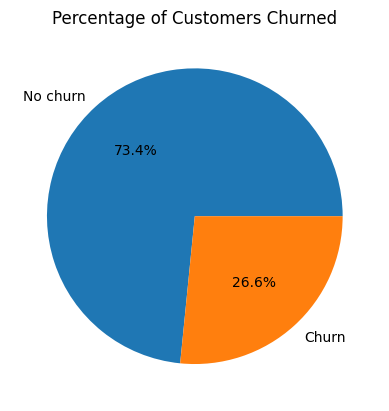

In [29]:
#checking for a class imbalance
classes = len(df[df['customer_churn'] == 1]) / len(df['customer_churn']) * 100
print('Percentage of customers in the dataframe that did not churn:', classes)

labels = ['No churn', 'Churn']
fig, ax = plt.subplots()
ax.pie(df['customer_churn'].value_counts(), labels=labels, autopct='%1.1f%%')
plt.title('Percentage of Customers Churned')
plt.show()

**Based on the pie chart above, the class imbalance occurs in the target column "customer_churn". There are more customers that are "loyal". Although this is great data for company morale, it's not best for our model. I will need to upsample to generate additional synthetic data points in the minority class (churn) in the Feature Engineering section of the project.**

**DATA VISUALIZATIONS**

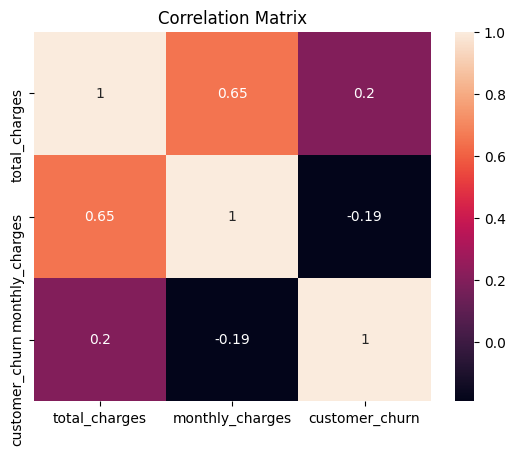

In [30]:
corr_matrix = df[['total_charges', 'monthly_charges', 'customer_churn']].corr(method='pearson')
sns.heatmap(corr_matrix, annot=True)
plt.title('Correlation Matrix')
plt.show()

count    7032.000000
mean       64.798208
std        30.085974
min        18.250000
25%        35.587500
50%        70.350000
75%        89.862500
max       118.750000
Name: monthly_charges, dtype: float64


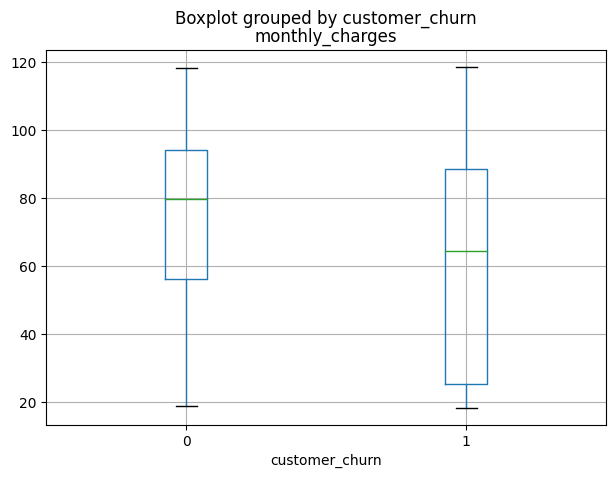

In [31]:
# Boxplot Monthly charges
df.boxplot(column='monthly_charges', by='customer_churn', figsize=(7,5))
print(df['monthly_charges'].describe())

count    7032.000000
mean     2283.300441
std      2266.771362
min        18.800000
25%       401.450000
50%      1397.475000
75%      3794.737500
max      8684.800000
Name: total_charges, dtype: float64


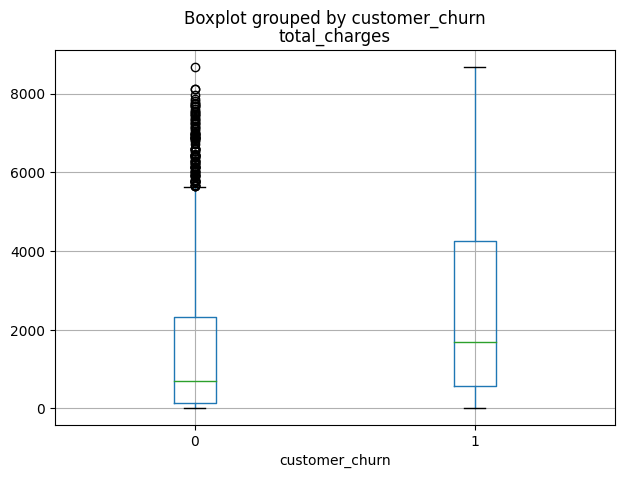

In [32]:
# Boxplot Total charges
df.boxplot(column='total_charges', by='customer_churn', figsize=(7,5))
print(df['total_charges'].describe())

**Based on the visualizations above, there are more active customers with total charges because the have accrued more payments over time due to the length of their membership. Although their total payments are high, the monthly amounts are less than customers who have churned. We can claim that customers who have lower monthly payments have a less likelihood of churning.**

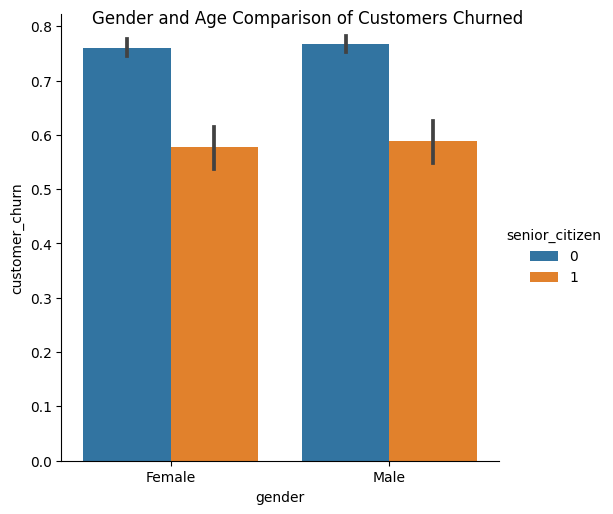

In [33]:
#visualize the churn of male-female customers and senior citizens
g = sns.catplot(data=df, x="gender", y="customer_churn", hue='senior_citizen', kind="bar")

g.fig.suptitle('Gender and Age Comparison of Customers Churned')
plt.show()

**Gender doesn't seem to have a factor in customer loyalty, but clearly age does. Senior citizens seem to have quite the higher number. I would like to explore this more**

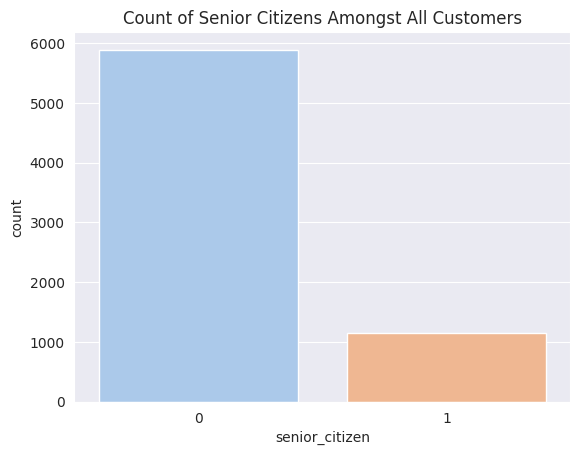

In [34]:
# Countplot of senior citizens
sns.set_style('darkgrid')
sns.countplot(x='senior_citizen', data=df, palette='pastel')
plt.title('Count of Senior Citizens Amongst All Customers')
plt.show()

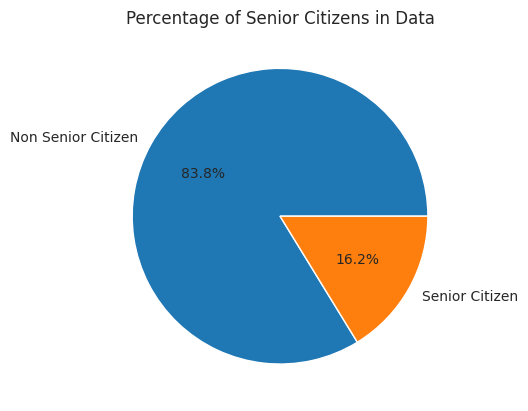

In [35]:
labels = ['Non Senior Citizen', 'Senior Citizen']
fig, ax = plt.subplots()
ax.pie(df['senior_citizen'].value_counts(), labels=labels, autopct='%1.1f%%')
plt.title('Percentage of Senior Citizens in Data')
plt.show()

**With only making up 16.2% of the churned population, senior citizens aren't a large group of the churned customers.**

# Work Plan 

*The goal of this project is to develop a model for Interconnect that can predict customer churn.*

**STEPS**

1. Import libraries and download the data.

2. Perform EDA 
- Pre-Processing
    - Merge all data into one DataFrame
    - Change column names to snake_case
    - Convert BeginDate column to datetime
    - Change datatype in TotalCharges column to "float64'
    - Drop cutsomer_ID column as it will not be needed for the model
    - Treat missing values 
    - Replace end_date column with customer_churn for target
    - Check for class imbalance
- Conduct Data Visualizations to dig deeper into Data
    - Explore correlation between total and monthly charges
    - Explore churn with age and gender correlation
    - Explore churn with senior citizens 

3. Feature Engineering
    - OHE coding
    - Check seasonality for BeginDate column
    - Upsample for class imbalance   

4. Model Training
    - Create a dummy benchmark to test various classification models
    - Utilize ROC-AUC accuracy scores for evaluation metrics
    - Add gradient boosting techniques
    - Fine tune with cross-validation
    - Evaluate final model on test set
    
5. Conclusion

# Clarifying Questions

1. How long does the company ideally expect a customer's "loyalty" to last?
2. Do all features in each dataset have an impact on the target?
3. Has the company attempted a previous model? How'd that work out?
4. Is it possible to get more data regarding geographic locations? 

# Feature Engineering

In [36]:
# Checking Seasonality 
# Creating year, month and day of week features 

df['begin_year'] = df['begin_date'].dt.year
df['begin_month'] = df['begin_date'].dt.month
df['begin_day_of_week'] = df['begin_date'].dt.dayofweek

df = df.drop({'begin_date'}, axis=1)

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7032 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   type               7032 non-null   object 
 1   paperless_billing  7032 non-null   object 
 2   payment_method     7032 non-null   object 
 3   monthly_charges    7032 non-null   float64
 4   total_charges      7032 non-null   float64
 5   gender             7032 non-null   object 
 6   senior_citizen     7032 non-null   int64  
 7   partner            7032 non-null   object 
 8   dependents         7032 non-null   object 
 9   internet_service   7032 non-null   object 
 10  online_security    7032 non-null   object 
 11  online_backup      7032 non-null   object 
 12  device_protection  7032 non-null   object 
 13  tech_support       7032 non-null   object 
 14  streaming_t_v      7032 non-null   object 
 15  streaming_movies   7032 non-null   object 
 16  multiple_lines     7032 

,begin_year,customer_churn,count
0,2013,0,8
1,2014,0,98
2,2014,1,1246
3,2015,0,123
4,2015,1,729
5,2016,0,145
6,2016,1,618
7,2017,0,199
8,2017,1,646
9,2018,0,315


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14 entries, 0 to 13
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   begin_year      14 non-null     int64
 1   customer_churn  14 non-null     int64
 2   count           14 non-null     int64
dtypes: int64(3)
memory usage: 464.0 bytes


None

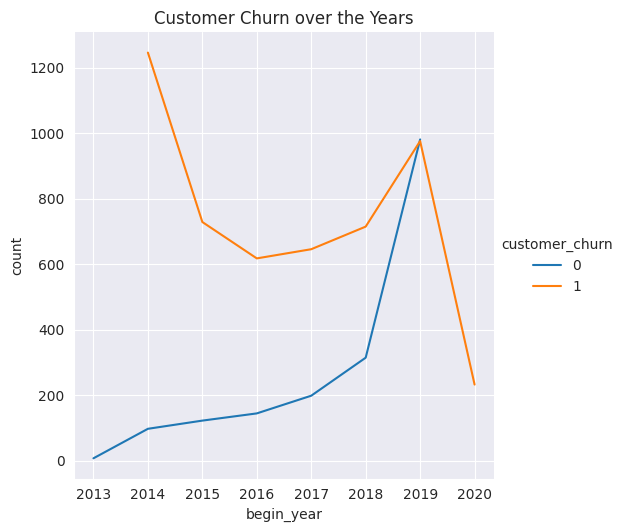

In [37]:
# Check 'begin_year' column for relationship to 'customer_churn'
year_df = df.groupby(['begin_year', 'customer_churn']).size().reset_index(name='count')

# Display the DataFrame
display(year_df)
display(year_df.info())

# Plot
sns.relplot(data=year_df, x='begin_year', y='count', hue='customer_churn', kind='line')
plt.title('Customer Churn over the Years')
plt.show()

**From 2016-2019, you can see an uptick on customers and then quite a drop in numbers from 2019. I'm assuming a a special promo for a contracted period occured in the business. Once the contract was up, or contract terms changed in 2019, a lot of customers left.**

,begin_month,customer_churn,count
0,1,0,94
1,1,1,529
2,2,0,122
3,2,1,671
4,3,0,107
5,3,1,483
6,4,0,98
7,4,1,413
8,5,0,126
9,5,1,368


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24 entries, 0 to 23
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   begin_month     24 non-null     int64
 1   customer_churn  24 non-null     int64
 2   count           24 non-null     int64
dtypes: int64(3)
memory usage: 704.0 bytes


None

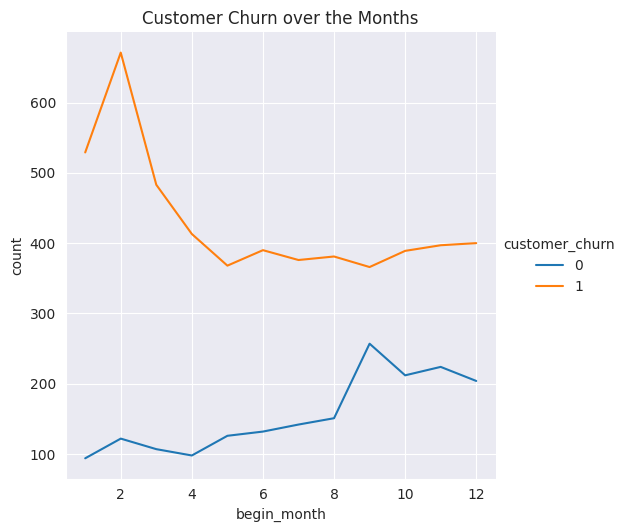

In [38]:
# Check 'begin_month' column for relationship to 'customer_churn'
month_df = df.groupby(['begin_month', 'customer_churn']).size().reset_index(name='count')

# Display the DataFrame
display(month_df)
display(month_df.info())

# Plot
sns.relplot(data=month_df, x='begin_month', y='count', hue='customer_churn', kind='line')
plt.title('Customer Churn over the Months')
plt.show()

**You can see here that a large number of customers left September - Decemeber.**

,begin_day_of_week,customer_churn,count
0,0,0,230
1,0,1,617
2,1,0,276
3,1,1,672
4,2,0,180
5,2,1,783
6,3,0,219
7,3,1,654
8,4,0,345
9,4,1,723


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14 entries, 0 to 13
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   begin_day_of_week  14 non-null     int64
 1   customer_churn     14 non-null     int64
 2   count              14 non-null     int64
dtypes: int64(3)
memory usage: 464.0 bytes


None

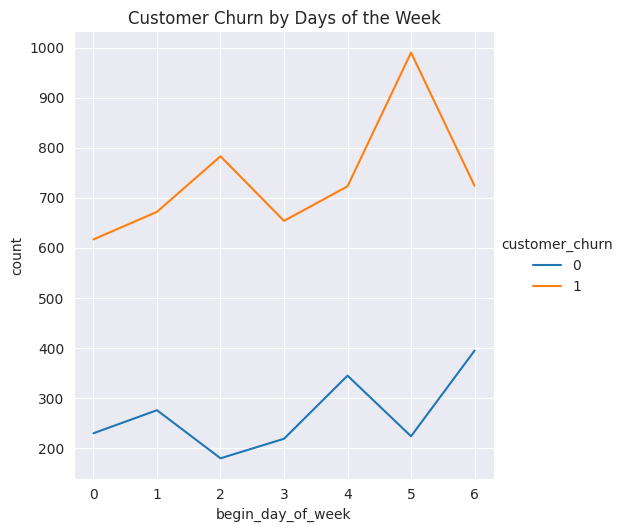

In [39]:
# Check 'begin_day_of_week' column for relationship to 'customer_churn'
day_df = df.groupby(['begin_day_of_week', 'customer_churn']).size().reset_index(name='count')

# Display the DataFrame
display(day_df)
display(day_df.info())

# Plot
sns.relplot(data=day_df, x='begin_day_of_week', y='count', hue='customer_churn', kind='line')
plt.title('Customer Churn by Days of the Week')
plt.show()


**After reviewing the year, month and day of the week, we can conlucde that customers who enrolled on a Thursday or Saturday in the last fiscal quarter (September - December) between 2018 and 2019 are largest group of customers who churned in this dataset.**

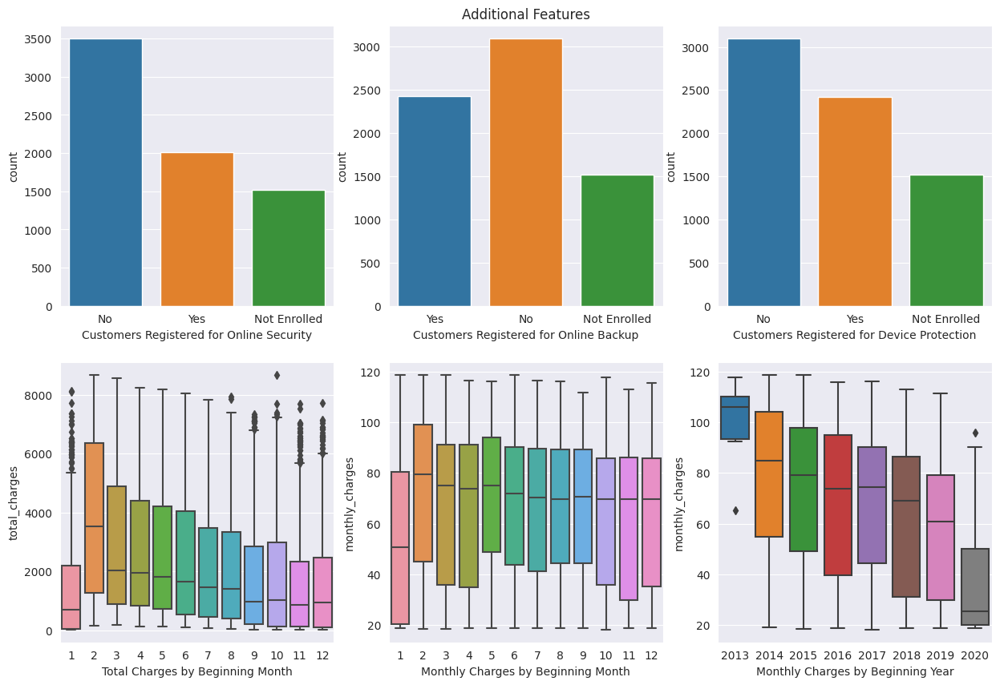

In [40]:
# Reviewing additional features
fig = plt.figure(figsize = (15, 10))

ax1 = fig.add_subplot(2,3,1)
sns.countplot(data=df, x='online_security', ax=ax1)
plt.xlabel('Customers Registered for Online Security')

ax2 = fig.add_subplot(2,3,2)
plt.title('Additional Features')
sns.countplot(data=df, x='online_backup', ax=ax2)
plt.xlabel('Customers Registered for Online Backup')

ax3 = fig.add_subplot(2,3,3)
sns.countplot(data=df, x='device_protection', ax=ax3)
plt.xlabel('Customers Registered for Device Protection')

ax4 = fig.add_subplot(2,3,4)
sns.boxplot(data=df, x='begin_month', y='total_charges', ax=ax4)
plt.xlabel('Total Charges by Beginning Month')

ax5 = fig.add_subplot(2,3,5)
sns.boxplot(data=df, x='begin_month', y='monthly_charges', ax=ax5)
plt.xlabel('Monthly Charges by Beginning Month')

ax6 = fig.add_subplot(2,3,6)
sns.boxplot(data=df, x='begin_year', y='monthly_charges', ax=ax6)
plt.xlabel('Monthly Charges by Beginning Year')

plt.show()

**After further review, here are some additional points to highlight:**
- Monthly charges decreased significantly in 2020. Most likely to help with all the customer churn in 2018 and 2019. 
- Due to very little  chnages in the monthly charges, we can assume the contract locked in customers at a fixed rate. 

## One Hot Encoding

In [41]:
#one hot encode the 'payment_method', 'paperless_billing', and 'type' columns.
df = pd.get_dummies(df, columns=['payment_method', 'paperless_billing', 'type'])

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7032 entries, 0 to 7042
Data columns (total 27 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   monthly_charges                           7032 non-null   float64
 1   total_charges                             7032 non-null   float64
 2   gender                                    7032 non-null   object 
 3   senior_citizen                            7032 non-null   int64  
 4   partner                                   7032 non-null   object 
 5   dependents                                7032 non-null   object 
 6   internet_service                          7032 non-null   object 
 7   online_security                           7032 non-null   object 
 8   online_backup                             7032 non-null   object 
 9   device_protection                         7032 non-null   object 
 10  tech_support                        

In [42]:
#label encoding
le = LabelEncoder()
categ = ['gender','senior_citizen', 'partner', 'dependents', 'internet_service', 'online_security', 'online_backup', 'device_protection', 'tech_support', 'streaming_t_v', 'streaming_movies', 'multiple_lines']

df[categ] = df[categ].apply(le.fit_transform)

df.head(10)

,monthly_charges,total_charges,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,...,begin_day_of_week,payment_method_Bank transfer (automatic),payment_method_Credit card (automatic),payment_method_Electronic check,payment_method_Mailed check,paperless_billing_No,paperless_billing_Yes,type_Month-to-month,type_One year,type_Two year
0,29.85,29.85,0,0,1,0,0,0,2,0,...,2,0,0,1,0,0,1,1,0,0
1,56.95,1889.50,1,0,0,0,0,2,0,2,...,5,0,0,0,1,1,0,0,1,0
2,53.85,108.15,1,0,0,0,0,2,2,0,...,1,0,0,0,1,0,1,1,0,0
3,42.30,1840.75,1,0,0,0,0,2,0,2,...,6,1,0,0,0,1,0,0,1,0
4,70.70,151.65,0,0,0,0,1,0,0,0,...,6,0,0,1,0,0,1,1,0,0
5,99.65,820.50,0,0,0,0,1,0,0,2,...,4,0,0,1,0,0,1,1,0,0
6,89.10,1949.40,1,0,0,1,1,0,2,0,...,6,0,1,0,0,0,1,1,0,0
7,29.75,301.90,0,0,0,0,0,2,0,0,...,0,0,0,0,1,1,0,1,0,0
8,104.80,3046.05,0,0,1,0,1,0,0,2,...,5,0,0,1,0,0,1,1,0,0
9,56.15,3487.95,1,0,0,1,0,2,2,0,...,0,1,0,0,0,1,0,0,1,0


##  Splitting Data

In [43]:
features = df.drop('customer_churn', axis=1)
target = df['customer_churn']

In [44]:
# Splitting data into training, validation, and test sets at a ratio of 60:20:20

# Split training and test sets
features_train, features_test, target_train, target_test = train_test_split(features, target, test_size=0.2, random_state=12345, stratify=target)

# Split validation set
features_train, features_valid, target_train, target_valid = train_test_split(features_train, target_train, test_size=0.25, random_state=12345, stratify=target_train)

print(features_train.shape)
print(target_train.shape)
print(features_valid.shape)
print(features_test.shape)

(4218, 26)
(4218,)
(1407, 26)
(1407, 26)


## Feature Scaling

In [45]:
numeric = ['monthly_charges', 'total_charges', 'begin_year','begin_month', 'begin_day_of_week']

def scaling(features_train, features_valid, features_test):
    scaler = MinMaxScaler()
    scaler.fit(features_train[numeric])
    features_train[numeric] = scaler.transform(features_train[numeric]) 
    features_valid[numeric] = scaler.transform(features_valid[numeric])
    features_test[numeric] = scaler.transform(features_test[numeric])
    return features_train, features_valid, features_test

scaling(features_train, features_valid, features_test)

(      monthly_charges  total_charges  gender  senior_citizen  partner  \
 95           0.604582       0.104836       0               0        0   
 4652         0.013944       0.052995       0               0        0   
 5571         0.613048       0.564964       1               0        1   
 320          0.639442       0.499801       0               1        0   
 303          0.418825       0.471979       0               0        1   
 ...               ...            ...     ...             ...      ...   
 5430         0.536853       0.089477       1               0        0   
 5954         0.366036       0.132322       1               0        0   
 948          0.804781       0.389680       1               1        0   
 6255         0.919323       0.875986       1               1        1   
 6756         0.712151       0.221563       1               1        1   
 
       dependents  internet_service  online_security  online_backup  \
 95             0                 1    

## Addressing Class Imbalance and Upsampling the Data

In [46]:
#function to upsample the data
def upsample(features, target, repeat):
    features_zeros = features[target == 0]
    features_ones = features[target == 1]
    target_zeros = target[target == 0]
    target_ones = target[target == 1]
    
    features_upsampled = pd.concat([features_ones] + [features_zeros]  * repeat)
    target_upsampled = pd.concat([target_ones] + [target_zeros] * repeat)

    features_upsampled, target_upsampled = shuffle(features_upsampled, target_upsampled, random_state=12345)

    return features_upsampled, target_upsampled

In [47]:
#apply upsample function to training set 
upsample_features_train, upsample_target_train = upsample(features_train, target_train, 3)

Balance of Classes:
0    0.520588
1    0.479412
Name: customer_churn, dtype: float64


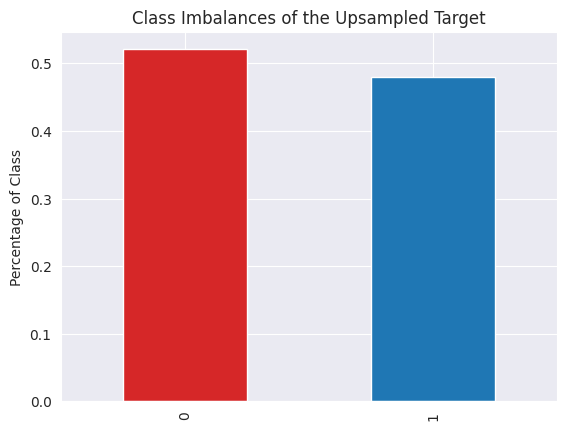

In [48]:
#re-examine class balances after upsampling
class_balance_upsampled = upsample_target_train.value_counts(normalize=True)
print('Balance of Classes:')
print(class_balance_upsampled)

fig, ax = plt.subplots()

bar_colors = ['tab:red', 'tab:blue']

class_balance_upsampled.plot.bar(ylabel='Percentage of Class', title='Class Imbalances of the Upsampled Target', color=bar_colors)


plt.show()

**Before the upsampling, we were at 73.4% to 26.6%, and now we're at 52% to 48%. The issue of class imbalance has been fixed, and now we can start the model training process**

# Model Training

In [49]:
# Create evaluation function to core and plot the auc-roc

#calculate auc-roc score
def auc_roc(model, features, target):
    probabilities_valid = model.predict_proba(features)
    probabilities_one_valid = probabilities_valid[:, 1]
    auc_roc = roc_auc_score(target, probabilities_one_valid)
    print('AUC - ROC Score:', auc_roc)
    
    fpr, tpr, thresholds = roc_curve(target, probabilities_one_valid)
    
    #calculate accuracy score on training set
    train_predictions = model.predict(features)
    train_accuracy = accuracy_score(target, train_predictions)
    print("Accuracy Score for the Training Set:", train_accuracy)
    
    #plot auc-roc curve
    plt.figure()
    plt.plot(fpr, tpr)
    plt.plot([0, 1], [0, 1], linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC curve')
    plt.show()
    return

## Dummy Model

Dummy Classifier:

AUC - ROC Score: 0.5
Accuracy Score for the Training Set: 0.5088841506751954


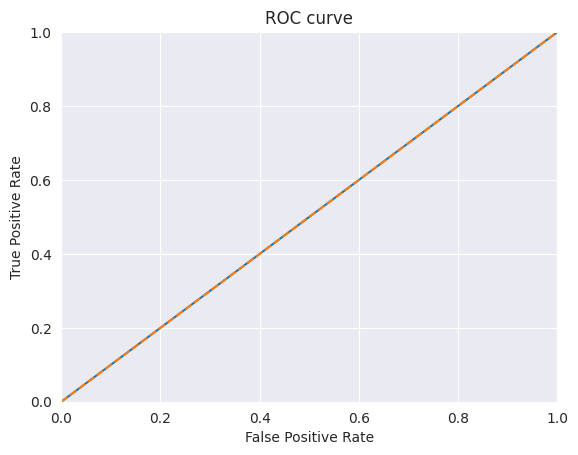

In [50]:
# Initialize dummy model
dummy_clf = DummyClassifier(strategy='uniform') #strategy is uniform because data is now balanced
dummy_clf.fit(upsample_features_train, upsample_target_train) #fit the dummy classifier to upsampled training set
dummy_pred = dummy_clf.predict(features_valid)

print('Dummy Classifier:')
print('')

# Evaluate the dummy model
auc_roc(dummy_clf, features_valid, target_valid)

**The dummy classifier has an AUC - ROC score of 0.5, which means it can not tell the difference between the two classes. This is essential as it will serve as a benchmark to compare other models.**

**LOGISTIC REGRESSION MODEL**

In [51]:
%%time
# Initialize Logistic Regression model
lr = LogisticRegression(random_state=12345)

# Parameter grid
lr_params = {
    'penalty' : ['l1', 'l2'],
    'solver' : ['newton-cg', 'lbfgs', 'liblinear', 'newton-cholesky', 'sag', 'saga'],
    'fit_intercept': [True, False],
    'n_jobs': list(range(1,10))
}

lr_clf = GridSearchCV(lr, lr_params, scoring='roc_auc', n_jobs=-1, cv=2)
lr_clf.fit(upsample_features_train, upsample_target_train)


/home/jovyan/.local/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jovyan/.local/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jovyan/.local/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn(
/home/jovyan/.local/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn(
/home/jovyan/.local/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn(
/

/home/jovyan/.local/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jovyan/.local/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jovyan/.local/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 9.
  warnings.warn(
/home/jovyan/.local/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 9.
  warnings.warn(
/home/jovyan/.local/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 9.
  warnings.warn(
/

/home/jovyan/.local/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
144 fits failed out of a total of 432.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
36 fits failed with the following error:
Traceback (most recent call last):
  File "/home/jovyan/.local/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/jovyan/.local/lib/python3.9/site-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/home/jovyan/.local/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py", line 1193, in fit
    solver = _check_solver(self.solver, se

CPU times: user 15.4 s, sys: 19.7 s, total: 35.2 s
Wall time: 45.2 s


GridSearchCV(cv=2, estimator=LogisticRegression(random_state=12345), n_jobs=-1,
             param_grid={'fit_intercept': [True, False],
                         'n_jobs': [1, 2, 3, 4, 5, 6, 7, 8, 9],
                         'penalty': ['l1', 'l2'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear',
                                    'newton-cholesky', 'sag', 'saga']},
             scoring='roc_auc')

In [52]:
print("Tuned Hyperparameters :", lr_clf.best_params_)
print("Accuracy :",lr_clf.best_score_)

Tuned Hyperparameters : {'fit_intercept': False, 'n_jobs': 1, 'penalty': 'l1', 'solver': 'saga'}
Accuracy : 0.8321953225931467


AUC - ROC Score: 0.8518411148671383
Accuracy Score for the Training Set: 0.7334754797441365


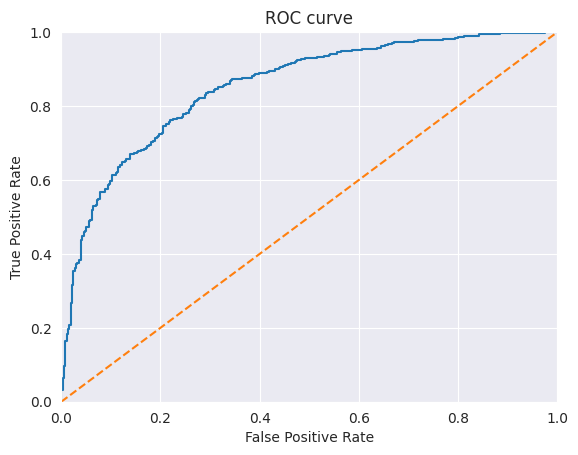

In [53]:
auc_roc(lr_clf, features_valid, target_valid)

**KNN MODEL**

In [54]:
%%time
# Initialize KNN model
knn = KNeighborsClassifier()

# Parameter grid
knn_params = {'n_neighbors': (5, 20, 100, 200, 500),
        'p':np.arange(1,3),
        'weights':['uniform','distance'],
        'algorithm':['auto','ball_tree','kd_tree','brute']
       }

knn_clf = GridSearchCV(knn, knn_params, scoring='roc_auc', cv=3)
knn_clf.fit(upsample_features_train, upsample_target_train)

CPU times: user 1min 3s, sys: 45.4 ms, total: 1min 3s
Wall time: 1min 3s


GridSearchCV(cv=3, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'n_neighbors': (5, 20, 100, 200, 500),
                         'p': array([1, 2]),
                         'weights': ['uniform', 'distance']},
             scoring='roc_auc')

In [55]:
print("Tuned Hyperparameters :", knn_clf.best_params_)
print("Accuracy :",knn_clf.best_score_)

Tuned Hyperparameters : {'algorithm': 'auto', 'n_neighbors': 200, 'p': 1, 'weights': 'distance'}
Accuracy : 0.9829529058485895


AUC - ROC Score: 0.8486936444911504
Accuracy Score for the Training Set: 0.689410092395167


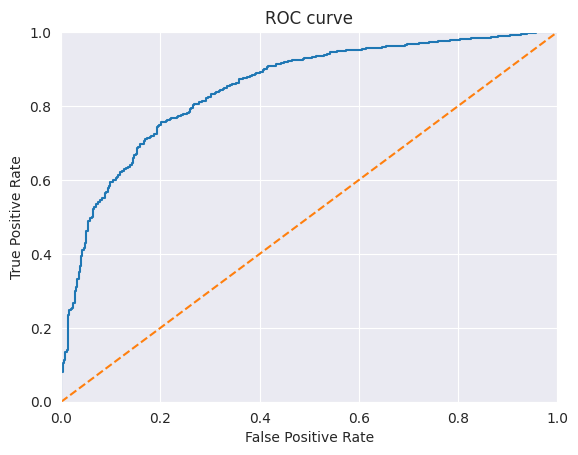

In [56]:
auc_roc(knn_clf, features_valid, target_valid)

**DECISION TREE MODEL**

In [57]:
%%time
# Initialize Decision Tree model
dt = DecisionTreeClassifier(random_state=12345)

# Parameter grid
dt_params = {'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy", "log_loss"],
    'splitter': ['best', 'random']       
            }
# Grid search
dt_clf = GridSearchCV(dt, param_grid=dt_params, cv=4, n_jobs=-1, verbose=1, scoring='roc_auc')
dt_clf.fit(upsample_features_train, upsample_target_train)

Fitting 4 folds for each of 150 candidates, totalling 600 fits
CPU times: user 7.64 s, sys: 0 ns, total: 7.64 s
Wall time: 7.66 s


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=12345),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100],
                         'splitter': ['best', 'random']},
             scoring='roc_auc', verbose=1)

In [58]:
print("Tuned Hyperparameters :", dt_clf.best_params_)
print("Accuracy :",dt_clf.best_score_)

Tuned Hyperparameters : {'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 5, 'splitter': 'best'}
Accuracy : 0.908453902206725


AUC - ROC Score: 0.8097294624969587
Accuracy Score for the Training Set: 0.7981520966595593


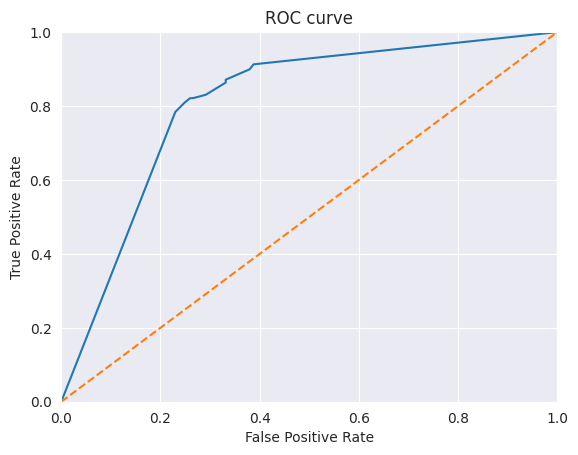

In [59]:
auc_roc(dt_clf, features_valid, target_valid)

**RANDOM FOREST MODEL**

In [60]:
%%time
# Initialize Random Forest model
rf = RandomForestClassifier(random_state=12345)

# Parameter grid
rf_params = {
    'n_estimators': [ 50, 100, 200],
    'criterion': ['gini', 'entropy'],
    'max_depth': [1, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
}

rf_clf = GridSearchCV(rf, param_grid=rf_params, scoring='roc_auc', cv=3)
rf_clf.fit(upsample_features_train, upsample_target_train)

CPU times: user 1min 26s, sys: 45.3 ms, total: 1min 26s
Wall time: 1min 26s


GridSearchCV(cv=3, estimator=RandomForestClassifier(random_state=12345),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [1, 10, 20, 30],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [50, 100, 200]},
             scoring='roc_auc')

In [61]:
print("Tuned Hyperparameters :", rf_clf.best_params_)
print("Accuracy :",rf_clf.best_score_)

Tuned Hyperparameters : {'criterion': 'entropy', 'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy : 0.9826908256114003


AUC - ROC Score: 0.8956805110497954
Accuracy Score for the Training Set: 0.8599857853589197


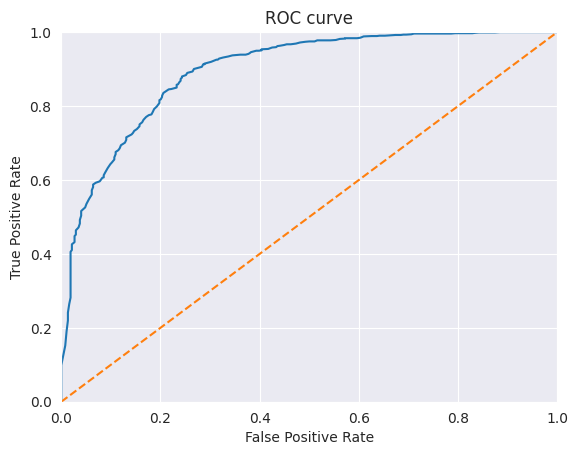

In [62]:
auc_roc(rf_clf, features_valid, target_valid)

## Boosting Models

**XGB**

In [83]:
# Debugging
import xgboost
import sklearn

print("XGBoost version:", xgboost.__version__)
print("Scikit-learn version:", sklearn.__version__)

XGBoost version: 2.1.4
Scikit-learn version: 1.6.1


In [65]:
%%time
# Define cross-validation strategy explicitly
cv_strategy = StratifiedKFold(n_splits=3, shuffle=True, random_state=12345)

# Initialize the XGBClassifier
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=12345)

# Define hyperparameter grid
xgb_params = {
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 300],
    'max_depth': [2, 5, 10],
    'subsample': [0.5, 0.7, 1]
}

# Use GridSearchCV with the explicit CV strategy
xgb_clf = GridSearchCV(xgb, xgb_params, cv=cv_strategy, scoring='roc_auc', error_score='raise')

# Fit the model
xgb_clf.fit(upsample_features_train, upsample_target_train)


/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:06] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:06] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:06] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:06] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:07] WARNING: /workspace/src/lea

/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:10] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:10] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:11] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:11] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:11] WARNING: /workspace/src/lea

/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:22] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:23] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:23] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:24] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:25] WARNING: /workspace/src/lea

/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:28] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:28] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:28] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:28] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:28] WARNING: /workspace/src/lea

/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:37] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:37] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:38] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:38] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:39] WARNING: /workspace/src/lea

/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:43] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:43] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:43] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:43] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:43] WARNING: /workspace/src/lea

/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:50] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:51] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:51] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:51] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/home/jovyan/.local/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [16:51:52] WARNING: /workspace/src/lea

CPU times: user 46.4 s, sys: 1.3 s, total: 47.7 s
Wall time: 48.1 s


GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=12345, shuffle=True),
             error_score='raise',
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False,
                                     eval_metric='logloss', feature_types=None,
                                     gamma=None, gro...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=12345, ...),
             param_grid={'learning_rate': [0.01, 0.1, 0.2],
                         'max_depth': [2, 5, 10],
                         'n_estimators': [100, 200, 300],
                         'subsample': [0.5, 0.7, 1]},
             scoring='roc_auc')

In [66]:
print("Tuned Hyperparameters :", xgb_clf.best_params_)
print("Accuracy :",xgb_clf.best_score_)

Tuned Hyperparameters : {'learning_rate': 0.2, 'max_depth': 10, 'n_estimators': 300, 'subsample': 1}
Accuracy : 0.9844798591439808


AUC - ROC Score: 0.9195893793581853
Accuracy Score for the Training Set: 0.8813077469793887


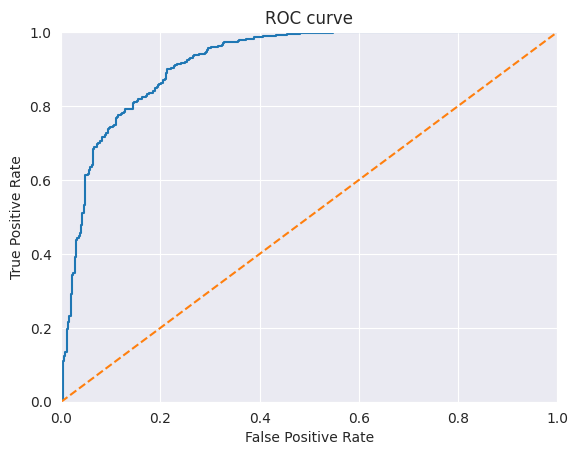

In [67]:
auc_roc(xgb_clf, features_valid, target_valid)

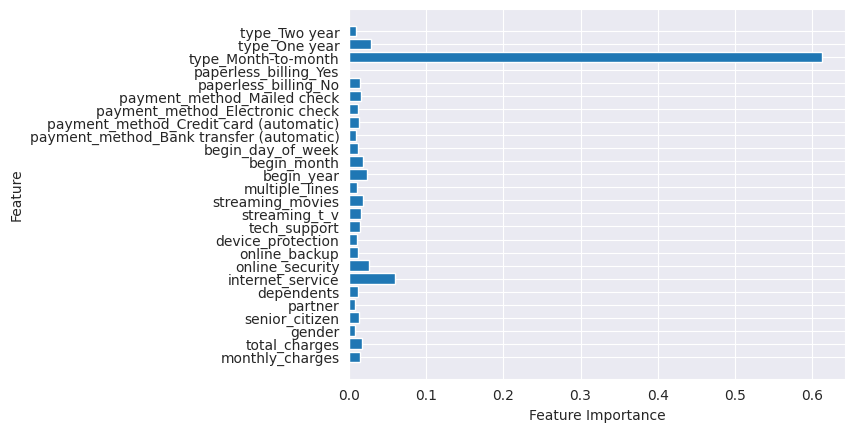

In [70]:
# Feature importance
feat_imp = xgb_clf.best_estimator_.feature_importances_
plt.barh(range(len(feat_imp)), feat_imp)
plt.yticks(range(len(feat_imp)), features_train.columns)
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.show()

**Light GBM**

In [74]:
%%time
# Initialize the LGBM model
lgbm = LGBMClassifier(random_state=12345)

# Parameter grid
lgbm_params = {
    'boosting_type': ['gbdt', 'dart', 'rf'],
    'num_leaves': [1, 5, 10, 20, 50],
    'learning_rate': [0.001, 0.01, 0.05, 0.1, 0.5, 0.75, 1],
    'feature_fraction': [0.1, 0.2, 0.5, 0.75, 1],
    'max_depth': [1, 5, 10, 20, 50],
    'min_data_in_leaf': [10, 25, 50, 100],
}

# Grid search
lgbm_clf = GridSearchCV(lgbm, lgbm_params, scoring='roc_auc', cv=3, verbose=2)
lgbm_clf.fit(upsample_features_train, upsample_target_train)

Fitting 3 folds for each of 10500 candidates, totalling 31500 fits
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: mi

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current va

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: m

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   1.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   1.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: m

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_d

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_d

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.5s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   4.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   1.6s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: mi

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: mi

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: m

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.5s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current va

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 w

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 w

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 wi

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ig

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ig

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: mi

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_le

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   1.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.5s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.7s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_le

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   3.7s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   1.6s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.6s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   3.4s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fe

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fe

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.5s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fe

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fe

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.8s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_lea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_l

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fractio

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fractio

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fractio

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fractio

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_frac

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_frac

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_frac

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_frac

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_frac

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_frac

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_frac

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_frac

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_frac

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=gbdt, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.5s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ig

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   1.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ig

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ig

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.6s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.6s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   2.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   1.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   2.0s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.5s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.6s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ig

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ig

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ig

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.6s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: m

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.5s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ig

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ig

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ig

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 wi

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 wi

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be i

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 wi

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.9s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Curr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Curr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.5s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be igno

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ign

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Curren

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Curr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: mi

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Curr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignor

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Curr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Curr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignore

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: mi

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Curr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Curr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=0.75, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.75
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current va

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.6s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.6s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.6s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_l

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.5s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fe

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fr

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV]

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV]

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_lea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[C

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.8s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_l

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feat

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current val

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fractio

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fractio

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fractio

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.4s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   1.8s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fract

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] E

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fract

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_frac

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fract

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fract

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_frac

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fract

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fract

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END boosting_type=dart, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, fea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, fea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, featu

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, featu

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, featu

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, featu

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=r

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fractio

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, fea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, lea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, lea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, lear

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, lear

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, le

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, lear

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, lear

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fractio

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fractio

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fractio

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.4s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, fea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, m

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, ma

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_ra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learnin

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learni

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learnin

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_ra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learni

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_ra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_ra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learni

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, lea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, featu

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, fe

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, featu

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, fe

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, fea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, featu

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, featu

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fractio

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fractio

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, featu

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, lear

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, l

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, le

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, le

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, le

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2,

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learn

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2,

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, le

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, lea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, lea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, l

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2,

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fractio

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fractio

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, fe

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, m

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learnin

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learnin

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_r

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learni

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learnin

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_ra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learn

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2,

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learnin

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learni

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.2, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fractio

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, featu

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, featu

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=r

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, f

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, fea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fractio

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, fea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learn

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, lea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, l

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learn

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fractio

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fractio

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fractio

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, lea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, le

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, lea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, lea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5,

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fractio

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fractio

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_f

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, le

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, ma

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, m

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_r

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learni

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, l

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_r

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_r

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learni

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learni

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_ra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learni

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.5, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, featu

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, fe

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, fe

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.4s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.4s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.3s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_ty

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=r

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_ty

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_typ

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=r

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_ty

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, fe

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, fea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.3s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.3s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.3s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.3s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.3s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.3s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, featu

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, fe

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, fe

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, featu

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.3s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, fe

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=r

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.3s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, featu

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, fea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.3s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.3s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.3s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.3s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.7

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fractio

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.7

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.7

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fractio

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, fea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fract

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, fe

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, featu

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, fea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, fe

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, fea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, featur

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learni

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_ra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learni

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learn

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, l

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, lear

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learn

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, lea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, lear

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75,

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, le

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, l

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, le

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=0.75, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, lear

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, lear

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learn

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, l

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learni

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, le

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learn

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, lea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, l

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_f

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fractio

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fractio

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_frac

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.001, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fractio

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_ra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learnin

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, lea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learnin

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learn

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, lea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learnin

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learnin

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, le

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, l

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fracti

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learni

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learni

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, lea

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, l

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.01, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learni

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_r

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_ra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, l

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learnin

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, l

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learnin

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learni

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learni

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, l

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learn

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learnin

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, l

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.05, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, m

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learnin

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learnin

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, l

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, ma

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, ma

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_ra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, lea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_ra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_ra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.5, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, lea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_ra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_ra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_ra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_ra

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learnin

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, lea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, lear

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, lear

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, lea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, l

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, lear

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learnin

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, l

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learn

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, lea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, lea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learn

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, l

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=0.75, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, 

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, m

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, mi

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=5, min_data_in_leaf=100, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/bo

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=1

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_d

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && c

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=10, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_de

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_dept

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_dept

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.3s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.2s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.2s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=20, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=1; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.4s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=5; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.3s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=10; total time=   0.4s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: config->baggi

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=10, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=25, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=1; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_dept

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.0s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/config_auto.cpp, line 334 .

[LightGBM] [Fatal] Check failed: (num_leaves) > (1) at /__w/1/s/python-package/compile/src/io/con

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=20; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=50, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=1; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_d

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check 

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=5; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=10; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.1s


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /__w/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/home/jovyan/.local/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
14700 fits failed out of a total of 31500.
The score on these train-test partitions for these parameters will

[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=20; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.1s
[CV] END boosting_type=rf, feature_fraction=1, learning_rate=1, max_depth=50, min_data_in_leaf=100, num_leaves=50; total time=   0.0s


/home/jovyan/.local/lib/python3.9/site-packages/sklearn/model_selection/_search.py:1108: UserWarning: One or more of the test scores are non-finite: [      nan 0.8243286 0.8243286 ...       nan       nan       nan]
  warnings.warn(


CPU times: user 1h 20min 19s, sys: 1min 1s, total: 1h 21min 21s
Wall time: 1h 22min 1s


GridSearchCV(cv=3, estimator=LGBMClassifier(random_state=12345),
             param_grid={'boosting_type': ['gbdt', 'dart', 'rf'],
                         'feature_fraction': [0.1, 0.2, 0.5, 0.75, 1],
                         'learning_rate': [0.001, 0.01, 0.05, 0.1, 0.5, 0.75,
                                           1],
                         'max_depth': [1, 5, 10, 20, 50],
                         'min_data_in_leaf': [10, 25, 50, 100],
                         'num_leaves': [1, 5, 10, 20, 50]},
             scoring='roc_auc', verbose=2)

In [75]:
print("Tuned Hyperparameters :", lgbm_clf.best_params_)
print("Accuracy :",lgbm_clf.best_score_)

Tuned Hyperparameters : {'boosting_type': 'gbdt', 'feature_fraction': 1, 'learning_rate': 0.5, 'max_depth': 50, 'min_data_in_leaf': 10, 'num_leaves': 50}
Accuracy : 0.989400526359771


AUC - ROC Score: 0.9189008702134379
Accuracy Score for the Training Set: 0.8834399431414357


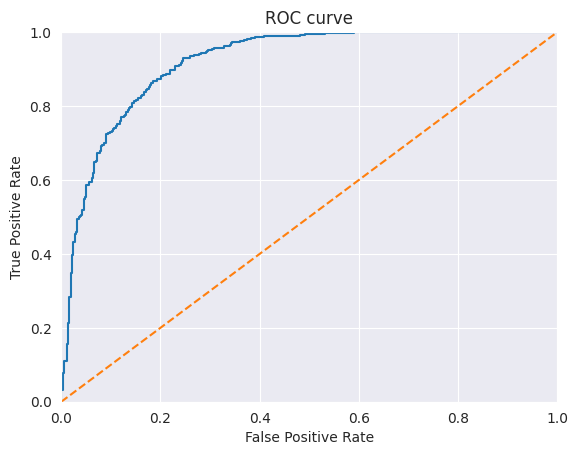

In [76]:
auc_roc(lgbm_clf, features_valid, target_valid)

## Evaluate Final Model: XGBM

In [77]:
# Final parameter grid
final_params = {
    'learning_rate': 0.2, 
    'max_depth': 10, 
    'n_estimators': 300, 
    'subsample': 1
}

# Initialize final model
fin_model = XGBClassifier(**final_params, random_state=12345)

# Train final model
fin_model.fit(upsample_features_train, upsample_target_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=300, n_jobs=None,
              num_parallel_tree=None, random_state=12345, ...)

In [78]:
# Predict final model
target_pred = fin_model.predict(features_test)
target_pred_proba = fin_model.predict_proba(features_test)[:, 1]

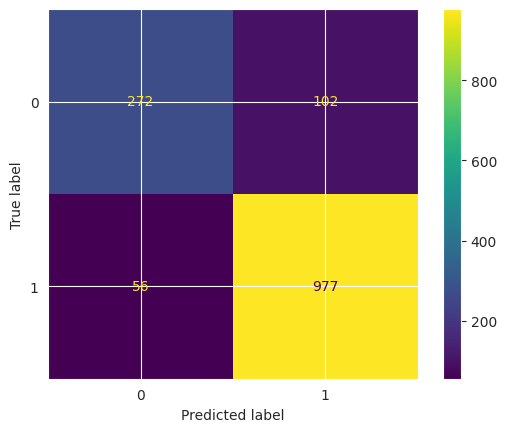

In [79]:
# Confusion matrix
cm = confusion_matrix(target_test, target_pred, labels=fin_model.classes_)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=fin_model.classes_)
disp.plot()
plt.show()

In [81]:
# AUC-ROC score for final model
print('AUC-ROC Score for Final Model:', roc_auc_score(target_test, target_pred_proba))
print('')

AUC-ROC Score for Final Model: 0.9188762806011254



AUC - ROC Score: 0.9188762806011254
Accuracy Score for the Training Set: 0.8877043354655295


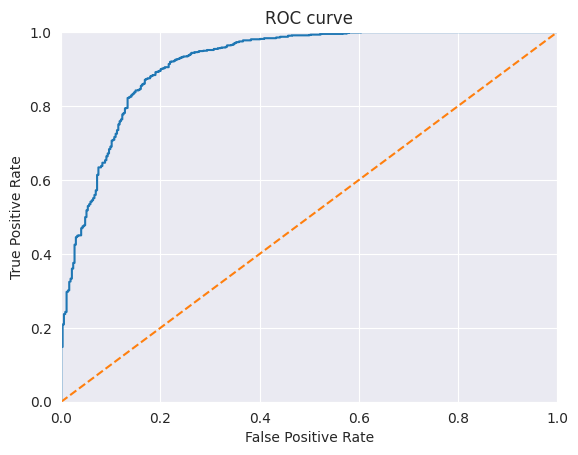

In [82]:
auc_roc(fiyn_model, features_test, target_test)

# Conclusion

**STEPS**

1. Imported libraries and downloaded the data.

2. EDA

- Pre-Processing
    - Merged all data into one DataFrame
    - Changed column names to snake_case
    - Converted BeginDate column to datetime
    - Changde datatype in TotalCharges column to "float64'
    - Dropped cutsomer_ID column as it was not needed for the model
    - Treat missing values
    - Replaced end_date column with customer_churn for target
    - Check for class imbalance
- Conducted Data Visualizations to dig deeper into Data
- Explored correlation between total and monthly charges
- Explored churn with age and gender correlation
- Explored churn with senior citizens

After pre-processing and exploring the data through visualizations, we can claim the following insights:
   - If you were a senior citizen who was a Interconnect client, it was very likely that you would drop out of your subscription.
   - Higher total charges did not correlate with high customer churn. 
   - Most of the features had mostly balanced classes.
   - Monthly charges decreased significantly in 2020. Most likely to help with all the customer churn in 2018 and 2019.
   - Due to very little chnages in the monthly charges, we can assume the contract locked in customers at a fixed rate.

3. Feature Engineering

- OHE coding
- Checked seasonality for BeginDate column
- Upsampled for class imbalance

I added three new features (year, month, and day of the week) to replace begin_date to check for seasonality and I also think this helped the model with accuracy since it highlighted meaningful data points in the dataset. I also encoded categorical features and lastly, scaled the data to help prepare for model training. 

4. Model Training

- Created a dummy benchmark to test various classification models
- Utilized ROC-AUC accuracy scores for evaluation metrics
- Added gradient boosting techniques
- Fine tuned with cross-validation
- Evaluated final model on test set

After evaluating multiple models, I found that XGBoost was the best model through the AUC-SCORE and Accuracy. I achieved and AUC - ROC Score of 0.9188 and Accuracy Score for the Training Set at 0.8877. I was pleased with these results so I left it at that. 